# Explore GRS images

## Load python libraries

In [18]:

import glob
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray  # activate the rio accessor
from shapely.geometry import box
import datetime as dt

import hvplot.xarray
import pyproj as ppj

#import cartopy
import cartopy.crs as ccrs
#import cartopy.feature as cfeature
#import locale
#locale.setlocale(locale.LC_ALL, 'en_US.utf8')
import matplotlib.pyplot as plt
import matplotlib as mpl
#mpl.use('TkAgg')


plt.rcParams.update({'font.family': 'Times New Roman',
                     'font.size': 16, 'axes.labelsize': 18,

                     })

rc = {"font.family" : "serif",
      "mathtext.fontset" : "stix"}
plt.rcParams.update(rc)
plt.rcParams["font.serif"] = ["Times New Roman"] + plt.rcParams["font.serif"]

import panel as pn

import grs
import grstbx
from grstbx import visual

u = grstbx.utils
opj = os.path.join


print(f'-grs: {grs.__version__}')
print(f'-grstbx: {grstbx.__version__}')

-grs: 2.2.0
-grstbx: 2.0.2


## Create datacube

In [19]:
rootdir ='/data/satellite/Sentinel-2/L2A/'
dcdir = '/data/satellite/Sentinel-2/datacube/'
tile ='30PYT'
suffix='_matchup'
start_year,end_year=2018,2018

In [20]:
# subset from lon/lat box
lonmin,latmin,lonmax,latmax=-.82,11.45,-0.485,11.8

bounds_pgon = box(lonmin,latmin,lonmax,latmax)
bbox =  gpd.GeoSeries.from_wkt([bounds_pgon.wkt]).set_crs(epsg=4326)

In [24]:
# subset from center location and width/height
clon,clat=-0.7766,11.663
height,width=1000,1000

ust = grstbx.SpatioTemp()
box = ust.wktbox(clon, clat, width=width, height=height, ellps='WGS84')
bbox = gpd.GeoSeries.from_wkt([box]).set_crs(epsg=4326)

In [21]:
pattern='*L2A*'
datadir = opj(rootdir, tile, '*', '*', '*', pattern)#,'*[0-9].nc')
list_files = glob.glob(datadir)
list_files
file_labels=['satellite','level','time','baseline','orbit','tile','processing_time']
indexes = ['time','satellite','tile','level','baseline','orbit','processing_time']
basenames = pd.Series([os.path.basename(p) for p in list_files])  # ,columns=['basename']) #basenames
df = basenames.str.split('_', expand=True)
df.columns=file_labels
df['path']=list_files
df['time'] = pd.to_datetime(df['time'])
df=df.set_index(indexes).sort_index(level=0)


In [22]:
start_date='2018-01-01'
end_date='2018-12-31'
files = df[start_date:end_date].values.ravel()
dc_path=opj(dcdir,tile+f'_{start_date}_{end_date}'+suffix+'.nc')
if not os.path.exists(dc_path):
    dc = grstbx.L2grs(files)
    dc.get_l2a_datacube(subset=bbox)
    
    dc.datacube.to_netcdf(dc_path)

In [25]:
dc = grstbx.L2grs(files)
dc.get_l2a_datacube(subset=bbox)

In [26]:
dc.datacube

<xarray.Dataset> Size: 35MB
Dimensions:                          (time: 25, wl: 11, y: 100, x: 101)
Coordinates:
  * wl                               (wl) int64 88B 443 490 560 ... 1610 2190
  * time                             (time) datetime64[ns] 200B 2018-01-02T10...
  * x                                (x) float64 808B 7.414e+05 ... 7.434e+05
  * y                                (y) float64 800B 1.291e+06 ... 1.289e+06
    central_wavelength               (time, wl) float32 1kB 442.7 ... 2.202e+03
    band                             int64 8B 1
    spatial_ref                      int64 8B 0
Data variables: (12/23)
    Rrs                              (time, wl, y, x) float64 22MB 0.02034 .....
    BRDFg                            (time, y, x) float64 2MB 0.1647 ... 0.0156
    aot550                           (time, y, x) float64 2MB 0.68 ... 0.235
    mask                             (time, y, x) uint8 252kB 0 0 0 0 ... 0 0 0
    vza                              (time, y, x) float64 2MB 5.56 5.56 ... 5.36
    sza                              (time, y, x) float64 2MB 40.91 ... 40.74
    ...                               ...
    flag_opac_cirrus                 (time) float64 200B 0.0 0.0 ... 0.009208
    flag_high_swir                   (time) float64 200B 0.4288 ... 0.2219
    flag_surfwater_land              (time) float64 200B 0.0 0.0 0.0 ... 0.0 0.0
    flag_surfwater_water             (time) float64 200B 1.0 1.0 1.0 ... 1.0 1.0
    flag_surfwater_cloud_and_shadow  (time) float64 200B 0.0 0.0 0.0 ... 0.0 0.0
    flag_neg_rrs                     (time) float64 200B 0.0 0.0 0.0 ... 0.0 0.0
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/30PYT...
    product_name:                        S2A_MSIL1C_20180102T102421_N0500_R06...
    product_filename:                    S2A_MSIL1C_20180102T102421_N0500_R06...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2018-01-02T10:24:21.000000000
    stop_date:                           2019-01-07T10:24:11.000000000

In [16]:
dcube=xr.open_dataset(dc_path,decode_coords='all')
dcube

<xarray.Dataset> Size: 11GB
Dimensions:                          (time: 25, wl: 11, y: 1669, x: 1843)
Coordinates:
  * wl                               (wl) int64 88B 443 490 560 ... 1610 2190
  * time                             (time) datetime64[ns] 200B 2018-01-02T10...
  * x                                (x) float64 15kB 7.376e+05 ... 7.744e+05
  * y                                (y) float64 13kB 1.3e+06 ... 1.267e+06
    central_wavelength               (time, wl) float32 1kB ...
    band                             int64 8B ...
    spatial_ref                      int64 8B ...
Data variables: (12/23)
    Rrs                              (time, wl, y, x) float64 7GB ...
    BRDFg                            (time, y, x) float64 615MB ...
    aot550                           (time, y, x) float64 615MB ...
    mask                             (time, y, x) uint8 77MB ...
    vza                              (time, y, x) float64 615MB ...
    sza                              (time, y, x) float64 615MB ...
    ...                               ...
    flag_opac_cirrus                 (time) float64 200B ...
    flag_high_swir                   (time) float64 200B ...
    flag_surfwater_land              (time) float64 200B ...
    flag_surfwater_water             (time) float64 200B ...
    flag_surfwater_cloud_and_shadow  (time) float64 200B ...
    flag_neg_rrs                     (time) float64 200B ...
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/30PYT...
    product_name:                        S2A_MSIL1C_20180102T102421_N0500_R06...
    product_filename:                    S2A_MSIL1C_20180102T102421_N0500_R06...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2018-01-02T10:24:21.000000000
    stop_date:                           2019-01-07T10:24:11.000000000

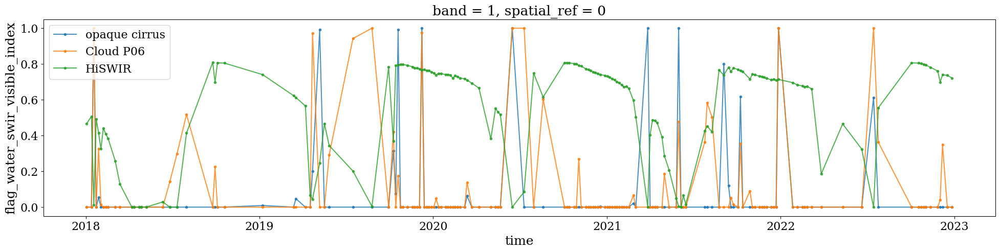

In [8]:

alpha=0.8
plt.figure(figsize=(24,5))
dcube.flag_opac_cirrus.plot(marker="o",ms=3,alpha=alpha,label='opaque cirrus')
dcube.flag_cloud_p06.plot(marker="o",ms=3,alpha=alpha,label='Cloud P06')
dcube.flag_water_swir_visible_index.plot(marker="o",ms=3,alpha=alpha,label='HiSWIR')
plt.legend()

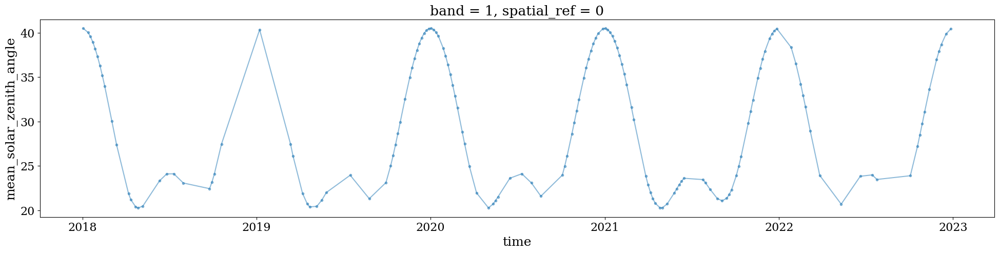

In [48]:
plt.figure(figsize=(24,5))
#dc.datacube.mean_solar_azimuth.plot()
dcube.mean_solar_zenith_angle.plot(marker="o",ms=3,alpha=alpha,label='SZA (deg)')



In [13]:


ncols=10


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = dcube.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

dem = dcube.dem
for ii,date in enumerate(dates):
    raster = dcube.sel(time=date)
    azi =float(raster.mean_solar_azimuth)
    sza=float(raster.mean_solar_zenith_angle)
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster.Rrs.sel(wl=[665,560,490]).where(raster.mask==0).plot.imshow(ax=axs[ii],rgb='wl', robust=True)
   
    axs[ii].set_title(date_+' (SZA:{:.1f}°;AZI:{:.1f}°)'.format(sza,azi),fontsize=16)


/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquanti

In [14]:
import hvplot.xarray
datafile= '/DATA/projet/bagre/data/MES_Kapore.csv'
insitu_data = pd.read_csv(datafile,index_col=0,date_format='%d/%m/%Y').to_xarray()
(insitu_data.spm.hvplot.scatter(label="in situ").opts(color='red', marker='o',size=7)).opts(fontscale=2, width=1500, height=600)

:Scatter   [time]   (spm)

In [15]:
v=visual.ViewSpectral(dcube.Rrs,reproject=True)
v.minmax=[0,0.1]
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2018, ...], start=datetime.date(2018, 1, 2), value=datetime.date(2018, 1, 2))
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.1, name='Range Slider', step=0.0001, value=(0, 0.02), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(DynamicMap, height=800, sizing_mode='fixed', width=1200)

In [54]:
geom_ = v.get_geom(v.aoi_stream,crs=dcube.rio.crs)

Rrs_clipped = dcube.Rrs.sel(wl=slice(400,1000)).where(dcube.mask==0).rio.clip(geom_.geometry.values)

In [55]:
dcube

<xarray.Dataset>
Dimensions:                          (time: 158, wl: 11, y: 100, x: 101)
Coordinates:
  * wl                               (wl) int64 443 490 560 ... 865 1610 2190
  * time                             (time) datetime64[ns] 2018-01-02T10:24:2...
  * x                                (x) float64 7.414e+05 ... 7.434e+05
  * y                                (y) float64 1.291e+06 ... 1.289e+06
    central_wavelength               (time, wl) float32 ...
    band                             int64 1
    spatial_ref                      int64 ...
Data variables: (12/23)
    Rrs                              (time, wl, y, x) float32 ...
    BRDFg                            (time, y, x) float32 ...
    aot550                           (time, y, x) float32 ...
    mask                             (time, y, x) uint8 0 0 0 0 0 ... 0 0 0 0 0
    vza                              (time, y, x) float32 ...
    sza                              (time, y, x) float32 40.91 40.91 ... 40.84
    ...                               ...
    flag_opac_cirrus                 (time) float64 ...
    flag_high_swir                   (time) float64 ...
    flag_surfwater_land              (time) float64 ...
    flag_surfwater_water             (time) float64 ...
    flag_surfwater_cloud_and_shadow  (time) float64 ...
    flag_neg_rrs                     (time) float64 ...
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/30PYT...
    product_name:                        S2A_MSIL1C_20180102T102421_N0500_R06...
    product_filename:                    S2A_MSIL1C_20180102T102421_N0500_R06...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2018-01-02T10:24:21.000000000
    stop_date:                           2022-12-27T10:24:31.000000000

In [56]:
stacked = Rrs_clipped.sel(wl=slice(400,1000)).dropna('time',thresh=0).stack(gridcell=["y", "x"]).dropna('gridcell',thresh=0).compute()
Npix_tot = len(stacked.gridcell)
group_coord ='wl'
stat_coord='gridcell'
stats = xr.Dataset({'median':stacked.groupby(group_coord).median(stat_coord)})
stats['Rrs_q25'] = stacked.groupby(group_coord).quantile(0.25,dim=stat_coord)
stats['Rrs_q75'] = stacked.groupby(group_coord).quantile(0.75,dim=stat_coord)
stats['Rrs_min'] = stacked.groupby(group_coord).min(stat_coord)
stats['Rrs_max'] = stacked.groupby(group_coord).max(stat_coord)
stats['Rrs_mean'] = stacked.groupby(group_coord).mean(stat_coord)
stats['Rrs_std'] = stacked.groupby(group_coord).std(stat_coord)
stats['sza'] = dcube.sza.mean('x').mean('y')
stats['pix_num'] = stacked.count(stat_coord)
stats['rel_pix_num'] =  stats['pix_num'] / Npix_tot

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, ou

In [57]:
float(insitu_data.sel(time=date,method='nearest').spm)

NameError: name 'date' is not defined

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


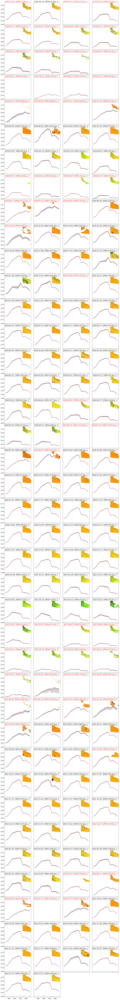

In [103]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
num_items = len(stats.time)
col_wrap=4
rows=int(np.ceil(num_items/col_wrap))
bands=[3,2,1]
fig, axs = plt.subplots(nrows=rows,ncols=col_wrap, sharex=True,sharey=True, figsize=(col_wrap*5+3, rows*5))#,sharey=True
fig.subplots_adjust(hspace=0.1,wspace=0.1)
axs_ = axs.ravel()
[axi.set_axis_off() for axi in axs_]
for iax,(time_,group) in enumerate(stats.groupby('time')): 
    group=group.squeeze()
    color='black'
    if group['rel_pix_num'].isel(wl=2).squeeze()<0.5:
        color='red'
    axs_[iax].set_axis_on()
    axs_[iax].minorticks_on()
    date = group.time.dt.date.values
    spm = float(insitu_data.sel(time=date,method='nearest').spm)
    axins = inset_axes(axs_[iax], width="25%", height="25%",
                   bbox_to_anchor=(.66, .66, 1.25, 1.25),
                   bbox_transform=axs_[iax].transAxes, loc=3)
   

    Rrs_clipped.sel(time=time_).isel(wl=bands).plot.imshow(robust=True,ax=axins)
    axins.set_title('')
    axins.set_axis_off()
    axs_[iax].axhline(y=0,color='k',lw=1)
    axs_[iax].plot(group.wl,group['median'],c='k')
    axs_[iax].plot(group.wl,group['Rrs_mean'],c='red',ls='--')
    axs_[iax].fill_between(group.wl, group['Rrs_q25'], group['Rrs_q75'],alpha=0.3,color='grey')
    axs_[iax].set_title(str(date)+', SPM='+str(spm)+r'$mg\cdot L^{-1}$',color=color)
plt.show()

In [58]:
good_dates = stats.where(stats.rel_pix_num>0.,drop=True).time.values

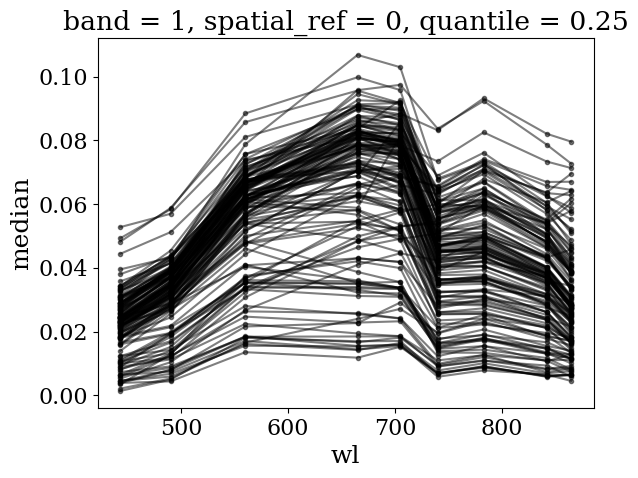

In [59]:
stats.sel(time=good_dates)['median'].plot(hue='time',marker='o',ms=3,color='k',alpha=0.5,add_legend=False)
plt.show()

In [210]:
def nechad_relationship(Rrs, coefs):
    rho_wl = np.pi * Rrs
    return coefs[0] * rho_wl / (1 - (rho_wl / coefs[1]))

def spm_N10(red, coefs=[342.1, 0.19563], valid_limit=[0, 2000]):
    ''' Semi-analytical algorithm to retrieve suspended particulate matter (in mg/l)
    from remote sensing reflectances (Rrs, in sr-1).
    This algorithm was published in Nechad et al., 2010
    '''
   
    spm = nechad_relationship(red, coefs)
    return spm#.where((spm >= valid_limit[0]),0).where(spm <= valid_limit[1])


def power_spm(ratio,a = [760,1.3]):
    return a[0] * ratio**a[1]

    
def obs2co(Rrs, switch=[0.07/np.pi, 0.14/np.pi], coef0=[610.94, 0.2324], coef1=[691.13, 2.5411], valid_limit=[None, None]):
    """ Switching Semi-analytical algorithm to retrieve suspended particulate
    matter (in mg/l) from remote sensing reflectances (Rrs, in sr-1).
    This algorithm was calibrated on GET radiometric database (Morin 2019)
    """
    red, nir = Rrs.sel(wl=665,method='nearest'), Rrs.sel(wl=865,method='nearest')
    spm_high = coef1[0] * (nir / red) ** coef1[1]
    spm_low = spm_N10(red, coef0)
    w = (red - switch[0]) / (switch[1] - switch[0])
    spm_mixing = (1 - w) * spm_low + w * spm_high

    spm = red.where(red > switch[0], spm_low)
    spm = spm.where(red < switch[1], spm_high)
    spm = spm.where((red <= switch[0]) | (red >= switch[1]), spm_mixing)
    return spm#.where((spm >= valid_limit[0]),0).where(spm <= valid_limit[1])

    
def han_saa(Rrs, 
           switch=[0.03, 0.04],
           coef0=[396, 0.5],
           coef1=[1208, 0.337]
          ):
    """ Switching Semi-analytical algorithm to retrieve suspended particulate
    matter (in mg/l) from remote sensing reflectances (Rrs, in sr-1).
    
    """
    red, nir = Rrs.sel(wl=665,method='nearest'), Rrs.sel(wl=750,method='nearest')
    
    spm_low = spm_N10(red, coefs=coef0)
    spm_high = spm_N10(red, coefs=coef1)
    
    mixing = np.log10(switch[1])-np.log10(red)
    wgt_low = xr.where(red<=switch[0],1,0)    
    wgt_low = wgt_low.where((red <= switch[0]) | (red >= switch[1]),mixing)
    
    mixing = np.log10(red)-np.log10(switch[0])
    wgt_hi = xr.where(red<=switch[0],0,1)
    wgt_hi = wgt_hi.where((red <= switch[0]) | (red >= switch[1]),mixing)

    return (wgt_low*spm_low+wgt_hi*spm_high)/(wgt_low+wgt_hi)
   

In [182]:
raster_han_spm = han_saa(Rrs_clipped)
raster_obs2co_spm=obs2co(Rrs_clipped)

In [183]:
.Rrs.sel(wl=450,method='nearest').plot(marker='o',ms=2,lw=0.3,color='blue')

SyntaxError: invalid syntax (2410319183.py, line 1)

In [184]:
np.log10(0.035)-np.log10(0.03)
np.log10(0.04)-np.log10(0.035)

0.05799194697768684

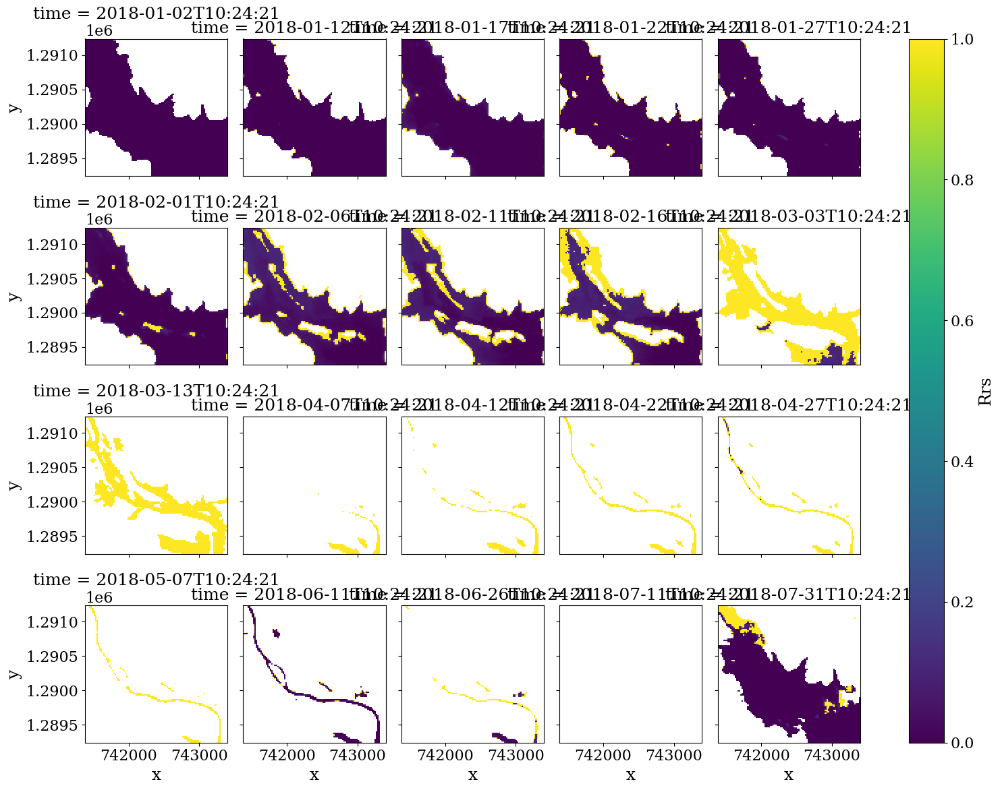

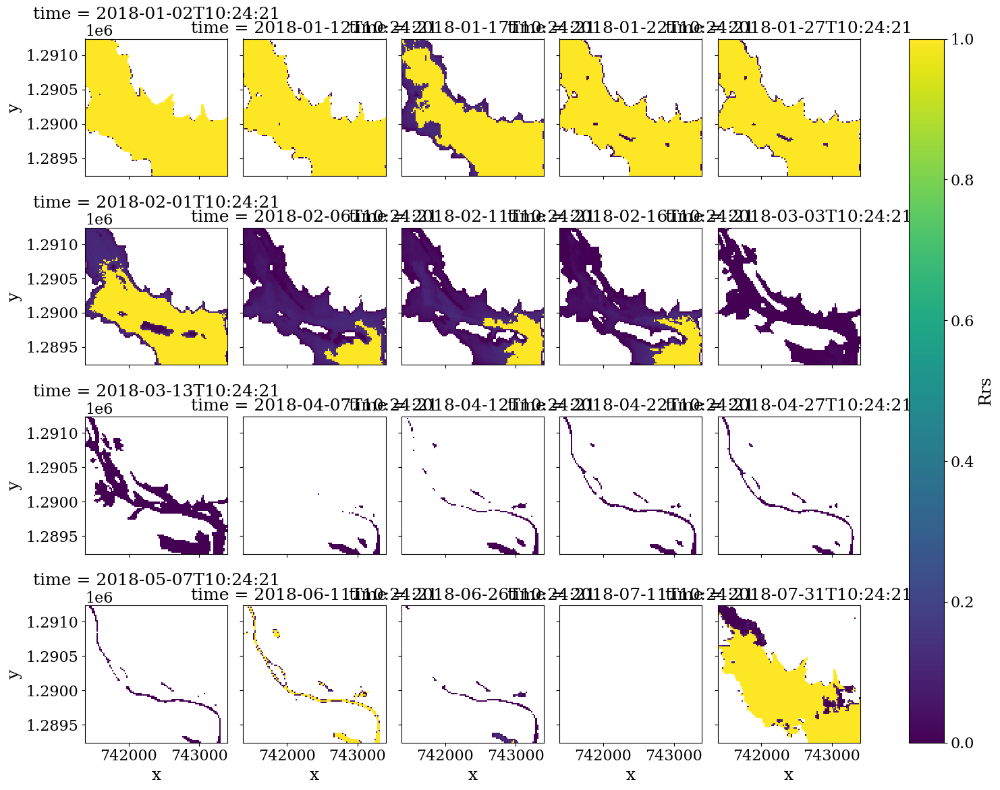

In [179]:
red, nir = Rrs.sel(wl=665,method='nearest'), Rrs.sel(wl=750,method='nearest')
    
spm_low = spm_N10(red, coefs=coef0)
spm_high = spm_N10(red, coefs=coef1)

mixing = np.log10(switch[1])-np.log10(red)
wgt_low = xr.where(red<=switch[0],1,0)

wgt_low = wgt_low.where((red <= switch[0]) | (red >= switch[1]),mixing)

mixing = np.log10(red)-np.log10(switch[0])
wgt_hi = xr.where(red<=switch[0],0,1)
wgt_hi = wgt_hi.where((red <= switch[0]) | (red >= switch[1]),mixing)
wgt_low.isel(time=slice(0,20)).plot(col='time',col_wrap=5)
wgt_hi.isel(time=slice(0,20)).plot(col='time',col_wrap=5)


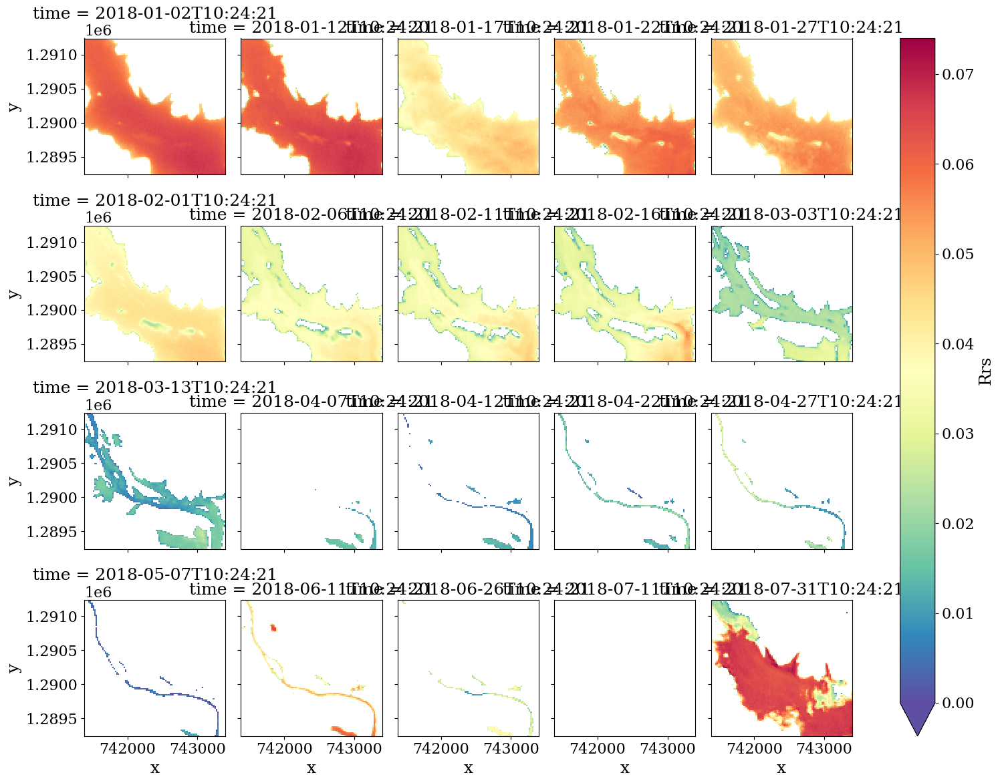

In [162]:
Rrs.sel(wl=665,method='nearest').isel(time=slice(0,20)).plot(col='time',col_wrap=5,vmin=0,cmap=plt.cm.Spectral_r)

In [230]:


ncols=10


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = dcube.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs_ = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs_.ravel()
[axi.set_axis_off() for axi in axs]

dem = dcube.dem
for ii,date in enumerate(dates):
    spm = spm_perso.sel(time=date)
    azi =float(raster.mean_solar_azimuth)
    sza=float(raster.mean_solar_zenith_angle)
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    mappa=spm.plot(ax=axs[ii],cmap=plt.cm.Spectral_r,vmin=10,vmax=1000,add_colorbar=False)
   
    axs[ii].set_title(date_+' (SZA:{:.1f}°;AZI:{:.1f}°)'.format(sza,azi),fontsize=16)
#fig.colorbar(mappa, ax=axs_, orientation='horizontal')

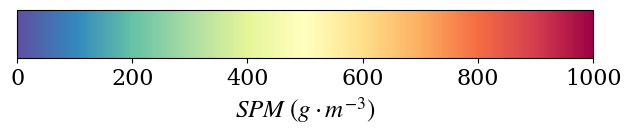

In [232]:

fig = plt.figure()
ax = fig.add_axes([0.05, 0.80, 0.9, 0.1])

cb = mpl.colorbar.ColorbarBase(ax, orientation='horizontal', 
                               norm=mpl.colors.Normalize(0, 1000),
                               label=r'$SPM\ (g\cdot m^{-3})$',
                               cmap='Spectral_r')
plt.savefig('/DATA/projet/magellium/vrac/bagre_spm_color_bar.png',dpi=600)

In [123]:
def func_exp2(acoef,x):
    return acoef[0]*np.exp(acoef[1]*x)+acoef[2]

def spm_bagre(Rrs,
              acoef=[211,1.07,-268],
              wl0=565,
              wl1=740):
    red, nir = Rrs.sel(wl=wl0,method='nearest'), Rrs.sel(wl=wl1,method='nearest')
    ratio=nir/red
    return func_exp2(acoef,ratio)

spm_perso=spm_bagre(Rrs_clipped)

In [137]:

def stats_dc(raster):
    stacked = raster.dropna('time',thresh=0).stack(gridcell=["y", "x"]).dropna('gridcell',thresh=0).compute()
    Npix_tot = len(stacked.gridcell)
    
    stat_coord='gridcell'
    stats = xr.Dataset({'spm_median':stacked.median(stat_coord)})
    stats['spm_q25'] = stacked.quantile(0.25,dim=stat_coord)
    stats['spm_q75'] = stacked.quantile(0.75,dim=stat_coord)
    stats['spm_min'] = stacked.min(stat_coord)
    stats['spm_max'] = stacked.max(stat_coord)
    stats['spm_mean'] = stacked.mean(stat_coord)
    stats['spm_std'] = stacked.std(stat_coord)
    stats['pix_num'] = stacked.count(stat_coord)
    stats['rel_pix_num'] =  stats['pix_num'] / Npix_tot
    return stats

In [222]:
  
def han_saa(Rrs, 
           switch=[0.03, 0.04],
           coef0=[396, 0.5],
           coef1=[1208, 0.337]
          ):
    """ Switching Semi-analytical algorithm to retrieve suspended particulate
    matter (in mg/l) from remote sensing reflectances (Rrs, in sr-1).
    
    """
    red, nir = Rrs.sel(wl=665,method='nearest'), Rrs.sel(wl=750,method='nearest')
    
    spm_low = spm_N10(red, coefs=coef0)
    spm_high = spm_N10(red, coefs=coef1)
    
    mixing = np.log10(switch[1])-np.log10(red)
    wgt_low = xr.where(red<=switch[0],1,0)    
    wgt_low = wgt_low.where((red <= switch[0]) | (red >= switch[1]),mixing)
    
    mixing = np.log10(red)-np.log10(switch[0])
    wgt_hi = xr.where(red<=switch[0],0,1)
    wgt_hi = wgt_hi.where((red <= switch[0]) | (red >= switch[1]),mixing)

    return (wgt_low*spm_low+wgt_hi*spm_high)/(wgt_low+wgt_hi)

raster_han_spm = han_saa(Rrs_clipped)
raster_obs2co_spm=obs2co(Rrs_clipped)

In [223]:
stats_perso=stats_dc(spm_perso)
stats_han=stats_dc(raster_han_spm)
stats_obs2co=stats_dc(raster_obs2co_spm)


/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1746: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/harmel/anaconda3/envs/py12/lib/python3.12/s

(17773.0, 19444.43357638889)

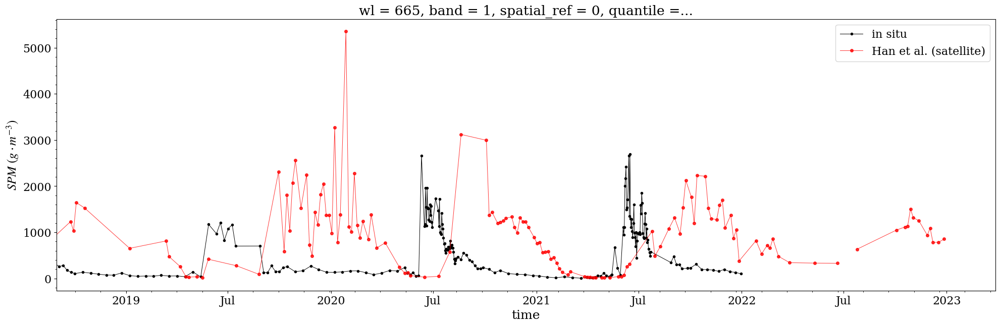

In [225]:
alpha=0.8
plt.figure(figsize=(24,7))
insitu_data.spm.plot(marker="o",ms=3,lw=0.7,color='k',label='in situ')
(stats_han.spm_median).plot(marker="o",ms=4,lw=0.7,color='red',alpha=alpha,label='Han et al. (satellite)')
#stats_obs2co.spm_median.plot(marker="o",ms=4,lw=0.7,color='blue',alpha=alpha,label='OBS2CO (satellite)')
#stats_perso.spm_median.plot(marker="o",ms=4,lw=0.7,color='green',alpha=alpha,label='Magellium (satellite)')

plt.legend()
plt.minorticks_on()
plt.ylabel(r'$SPM\ (g\cdot m^{-3})$')
plt.xlim(left=pd.Timestamp("2018-08-30 00:00:00"))

[]

<Figure size 2400x700 with 0 Axes>

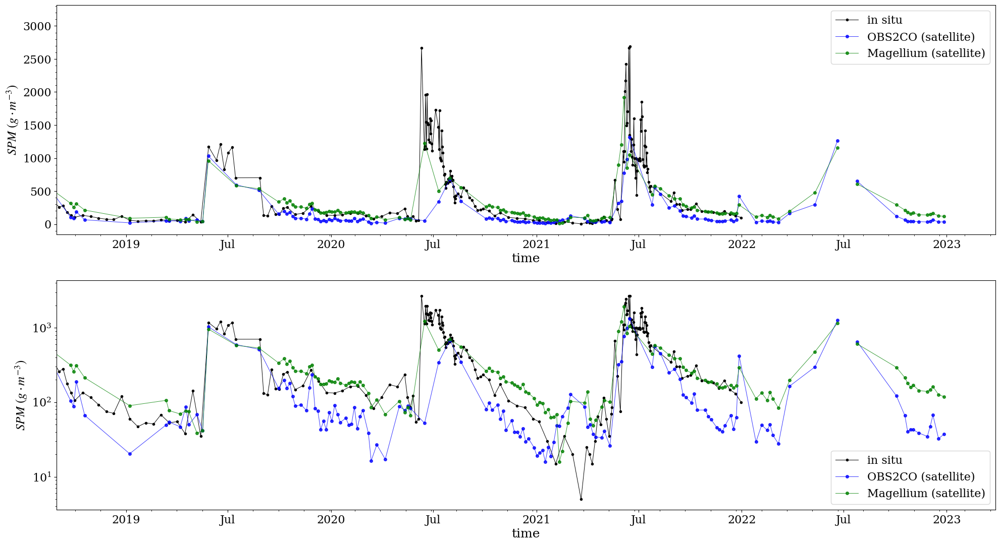

In [228]:
alpha=0.8
plt.figure(figsize=(24,7))
fig, axs = plt.subplots(nrows=2,figsize=(24,13))

for ax in axs:
    insitu_data.spm.plot(marker="o",ms=3,lw=0.7,color='k',label='in situ',ax=ax)
    #(stats_han.spm_median*10000).plot(marker="o",ms=4,lw=0.7,color='red',alpha=alpha,label='Han et al. (satellite)')
    stats_obs2co.spm_median.plot(marker="o",ms=4,lw=0.7,color='blue',alpha=alpha,label='OBS2CO (satellite)',ax=ax)
    stats_perso.spm_median.plot(marker="o",ms=4,lw=0.7,color='green',alpha=alpha,label='Magellium (satellite)',ax=ax)
    
    ax.legend()
    ax.minorticks_on()
    ax.set_ylabel(r'$SPM\ (g\cdot m^{-3})$')
    ax.set_xlim(left=pd.Timestamp("2018-08-30 00:00:00"))
    ax.set_title('')
ax.semilogy()

(17773.0, 19444.43357638889)

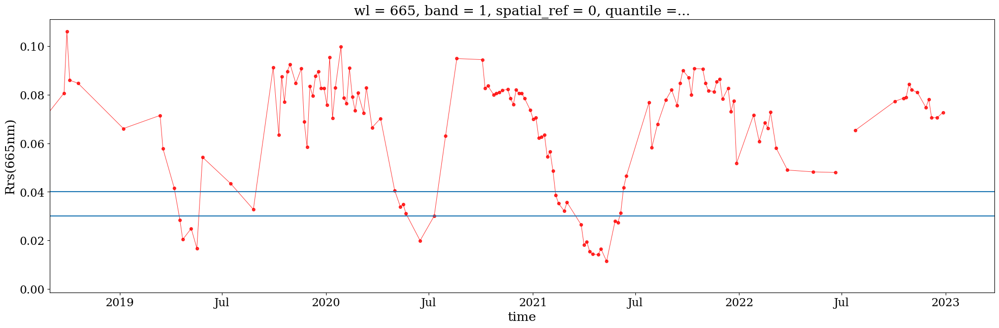

In [209]:
alpha=0.8
plt.figure(figsize=(24,7))

stats_han.spm_median.plot(marker="o",ms=4,lw=0.7,color='red',alpha=alpha,label='Han et al. (satellite)')
plt.axhline(0.03)
plt.axhline(0.04)
plt.ylabel('Rrs(665nm)')
plt.xlim(left=pd.Timestamp("2018-08-30 00:00:00"))

<Figure size 640x480 with 0 Axes>

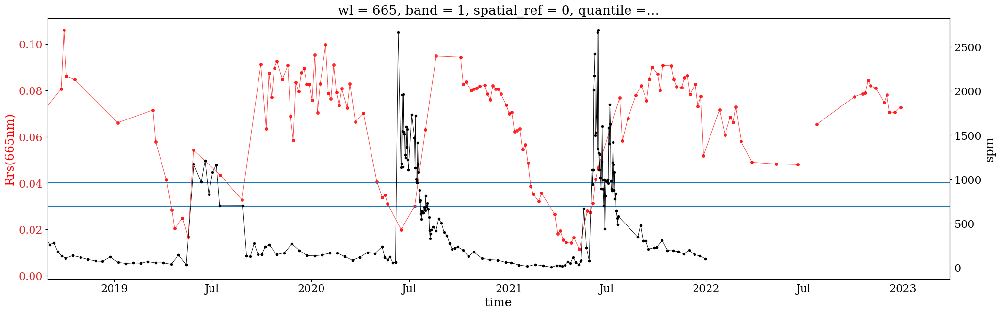

In [216]:
alpha=0.8
plt.figure()

fig, ax1 = plt.subplots(figsize=(24,7))

color = 'tab:red'

ax1.tick_params(axis='y', labelcolor=color)
stats_han.spm_median.plot(ax=ax1,marker="o",ms=4,lw=0.7,color='red',alpha=alpha,label='Han et al. (satellite)')
ax1.axhline(0.03)
ax1.axhline(0.04)
ax1.set_ylabel('Rrs(665nm)',color='red')
ax1.set_xlim(left=pd.Timestamp("2018-08-30 00:00:00"))
ax2 = ax1.twinx()  # instantiate a second Axes that shares the same x-axis

color = 'tab:black'
ax2.set_ylabel('in situ SPM', color='black')  # we already handled the x-label with ax1
insitu_data.spm.plot(marker="o",ms=3,lw=0.7,color='k',label='in situ',ax=ax2)
#ax2.tick_params(axis='y', color=color)

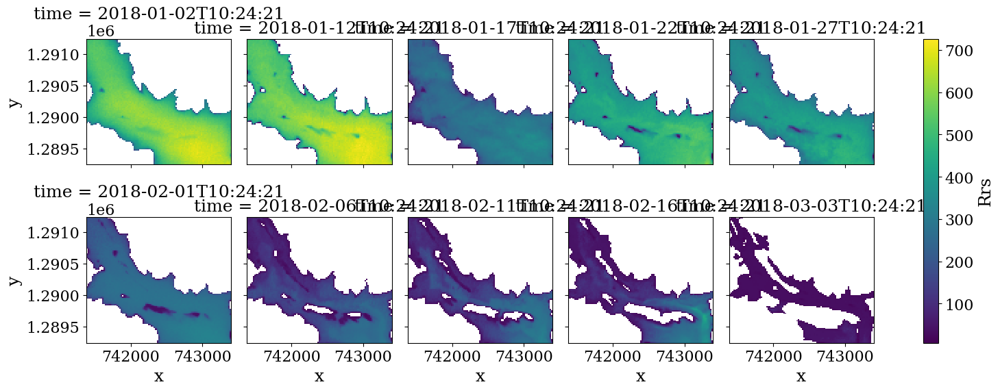

In [93]:
Rrs_clipped = dcube.Rrs.sel(wl=slice(400,1000))
Rrs=Rrs_clipped

switch=[0.03, 0.04]
coef0=[396, 0.5]
coef1=[1208, 0.337]
red, nir = Rrs.sel(wl=665,method='nearest'), Rrs.sel(wl=750,method='nearest')
    
spm_low = spm_N10(red, coefs=coef0)
spm_high = spm_N10(red, coefs=coef1)

wgt_low = np.log10(switch[1])-np.log10(red)
wgt_low = wgt_low.where(red>switch[0],1)
wgt_low = wgt_low.where((red<switch[1]),0)

wgt_hi = np.log10(red)-np.log10(switch[0])
wgt_hi = wgt_hi.where(red>switch[0],0)
wgt_hi = wgt_hi.where(red<switch[1],1)

spm = (wgt_low*spm_low+wgt_hi*spm_high)/(wgt_low+wgt_hi)
spm.isel(time=slice(0,10)).plot(col='time',col_wrap=5)

Text(0.5, 0, '$R_{rs}(865nm)/R_{rs}(565nm)$')

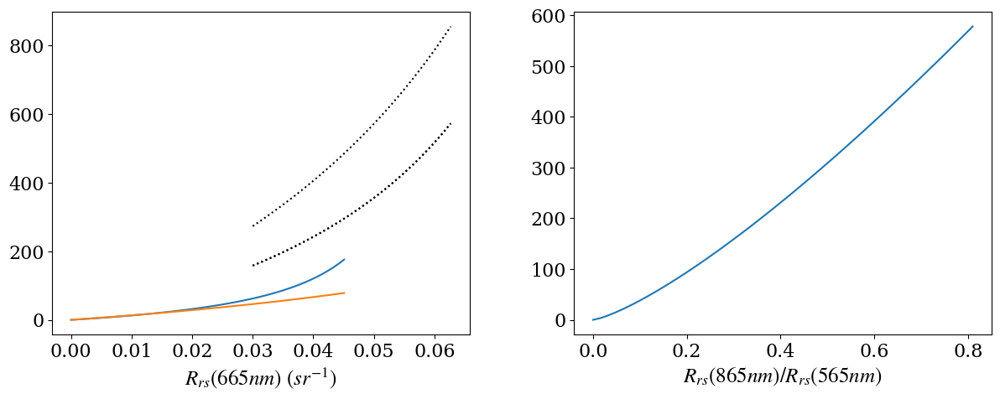

In [164]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))
fig.subplots_adjust(left=0.1, right=0.9, hspace=.25, wspace=0.25)
axs = axs.ravel()
ax=axs[0]
red=np.linspace(0,0.0451)
ax.plot(red,spm_N10(red))
ax.plot(red,spm_N10(red,coefs=[396, 0.5]))

red=np.linspace(0.03,0.0627)
ax.plot(red,spm_N10(red,coefs=[1208, 0.337]),color='k',ls=':')
red=np.linspace(0.03,0.0627)
ax.plot(red,spm_N10(red,coefs=[1208, 0.337]),color='k',ls=':')
red=np.linspace(0.03,0.0627)
ax.plot(red,spm_N10(red,coefs=[2220, 0.403]),color='k',ls=':')
ax.set_xlabel(r'$R_{rs}(665nm)\ (sr^{-1})$')

ax=axs[1]
ratio=np.linspace(0,0.81)
ax.plot(ratio,han_spm_ratio(ratio))
#red=np.linspace(0.045,0.0627)
#plt.plot(red,spm_N10(red),color='k',ls=':')
ax.set_xlabel(r'$R_{rs}(865nm)/R_{rs}(565nm)$')


In [60]:
sat_time = stats.time.reset_coords(drop=True)
sat_time.name = 'sat_time'

sat_time
insitu_time = insitu_data.time
insitu_time.name = 'insitu_time'


In [61]:
insitu_data.time.to_dataframe()

,time
time,
2018-03-13,2018-03-13
2018-03-27,2018-03-27
2018-04-10,2018-04-10
2018-04-24,2018-04-24
2018-05-08,2018-05-08
...,...
2021-11-21,2021-11-21
2021-12-01,2021-12-01
2021-12-11,2021-12-11


In [95]:
matchup_time = pd.merge_asof(
    sat_time.to_dataframe(),
    insitu_time.to_dataframe(),
    tolerance=pd.Timedelta("2d"),left_index=True, right_index=True).dropna()
matchup_time

,sat_time,insitu_time
time,,
2018-03-13 10:24:21,2018-03-13 10:24:21,2018-03-13
2018-06-26 10:24:21,2018-06-26 10:24:21,2018-06-26
2018-07-11 10:24:21,2018-07-11 10:24:21,2018-07-10
2018-07-31 10:24:21,2018-07-31 10:24:21,2018-07-31
2019-04-17 10:24:21,2019-04-17 10:24:21,2019-04-16
2019-07-16 10:24:21,2019-07-16 10:24:21,2019-07-15
2019-10-09 10:24:21,2019-10-09 10:24:21,2019-10-08
2019-10-29 10:24:21,2019-10-29 10:24:21,2019-10-29
2020-01-07 10:24:21,2020-01-07 10:24:21,2020-01-07


In [96]:
xmatchup = stats.sel(time=matchup_time['sat_time'].values)  
insitu_matchup = insitu_data.sel(time=matchup_time['insitu_time'].values)
insitu_matchup['time']=xmatchup['time']
xmatchup['spm']=insitu_matchup.spm

In [97]:
xmatchup

<xarray.Dataset>
Dimensions:             (wl: 9, time: 46)
Coordinates:
  * wl                  (wl) int64 443 490 560 665 705 740 783 842 865
  * time                (time) datetime64[ns] 2018-03-13T10:24:21 ... 2021-12...
    central_wavelength  (time, wl) float32 442.7 492.7 559.9 ... 832.8 864.7
    band                int64 1
    spatial_ref         int64 0
    quantile            float64 0.25
Data variables:
    median              (time, wl) float32 0.00455 0.00672 ... 0.03893 0.0302
    Rrs_q25             (time, wl) float64 0.00365 0.00523 ... 0.03818 0.02955
    Rrs_q75             (time, wl) float64 0.00585 0.0088 ... 0.0398 0.031
    Rrs_min             (time, wl) float32 0.00136 0.0027 ... 0.02945 0.02055
    Rrs_max             (time, wl) float32 0.00804 0.01325 ... 0.04185 0.03318
    Rrs_mean            (time, wl) float32 0.004725 0.007065 ... 0.03893 0.03023
    Rrs_std             (time, wl) float32 0.001386 0.002249 ... 0.001079
    sza                 (time) float32 27.68 23.98 nan ... 38.34 39.79 40.65
    pix_num             (time, wl) int64 1293 1293 1293 1293 ... 6970 6970 6970
    rel_pix_num         (time, wl) float64 0.128 0.128 0.128 ... 0.6901 0.6901
    spm                 (time) int64 23 648 438 614 38 ... 190 155 196 147 131

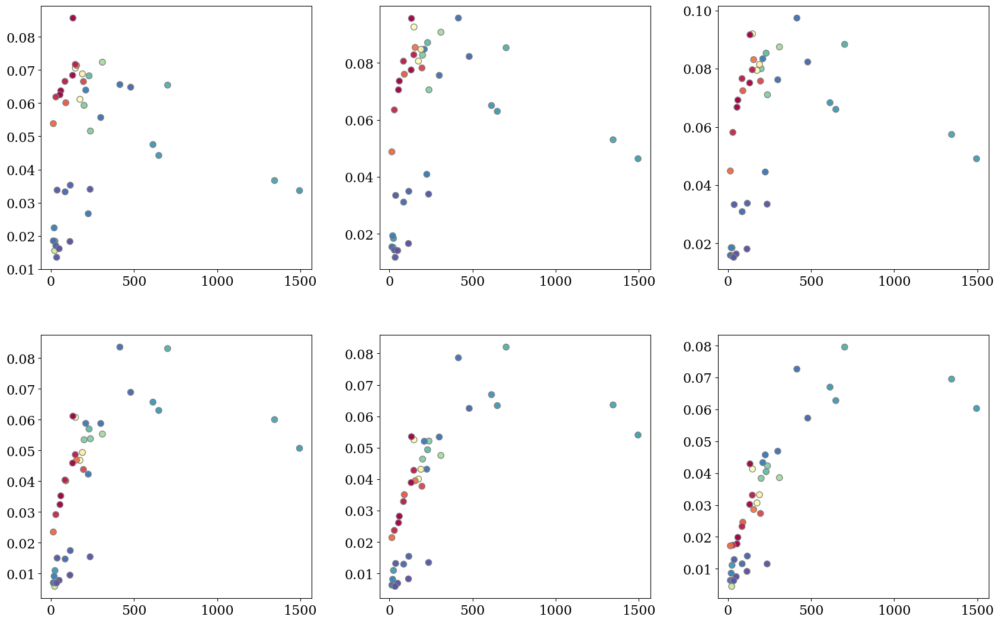

In [98]:
cmap=plt.cm.Spectral_r
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 13))
fig.subplots_adjust(left=0.1, right=0.9, hspace=.25, wspace=0.25)
axs = axs.ravel()
for ii,wl in  enumerate([560,665,705,740,840,865]):
    ax=axs[ii]
    x, y = xmatchup.spm,xmatchup['median'].sel(wl=wl,method='nearest')
    color=xmatchup.sza #pix_num.sel(wl=wl,method='nearest')
    ax.scatter(x, y, c=color, cmap=cmap, edgecolors='grey', s=55, alpha=0.97, linewidth=1,zorder=2)


In [99]:
from scipy.optimize import least_squares

def func_exp(acoef,x):
    return acoef[0]*np.exp(acoef[1]*x)

def func_exp2(acoef,x):
    return acoef[0]*np.exp(acoef[1]*x)+acoef[2]

def func(acoef,x_, y_):
    x = x_[~np.isnan(x_) & ~np.isnan(y_)]
    y = y_[~np.isnan(x_) & ~np.isnan(y_)]
    spm_simu=func_exp(acoef,y)
       
    return spm_simu - x


def func2(acoef,x_, y_):
    x = x_[~np.isnan(x_) & ~np.isnan(y_)]
    y = y_[~np.isnan(x_) & ~np.isnan(y_)]
    spm_simu=func_exp2(acoef,y)
       
    return spm_simu - x

In [100]:
np.sqrt(np.mean((func_exp2(acoef2,y)-x)**2))

<xarray.DataArray ()>
array(396.21266019)
Coordinates:
    wl           int64 865
    band         int64 1
    spatial_ref  int64 0
    quantile     float64 0.25

(0.0, 1515.0)

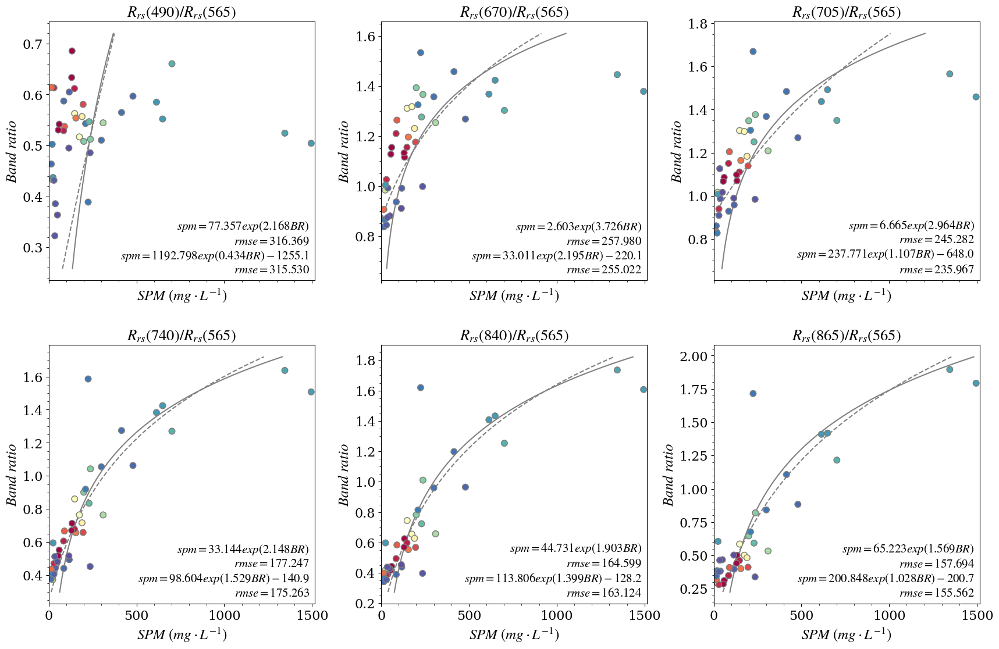

In [102]:
wl_ref=565
cmap = plt.cm.Spectral_r
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 13),sharex=True)
fig.subplots_adjust(left=0.1, right=0.9, hspace=.25, wspace=0.25)
axs = axs.ravel()


for ii,wl in  enumerate([490,670,705,740,840,865]):
    ax=axs[ii]
   
    x, y = xmatchup.spm,xmatchup['median'].sel(wl=wl,method='nearest')/xmatchup['median'].sel(wl=wl_ref,method='nearest')
    color=xmatchup.sza #pix_num.sel(wl=wl,method='nearest')
    ax.scatter(x, y, c=color, cmap=cmap, edgecolors='grey', s=55, alpha=0.97, linewidth=1,zorder=2)
    #y_std = ds.Rrs_std.sel(wl=wl,method='nearest')
    ratio_simu = np.linspace(y.min()*0.8,y.max()*1.05,1000)
    
    acoef=[1,1]
    res_lsq = least_squares(func, acoef, args=( x,y),diff_step=1e-4)
    acoef = res_lsq.x
    rmse = float(np.sqrt(np.mean((func_exp(acoef,y)-x)**2)))
  
    ax.plot(func_exp(acoef,ratio_simu),ratio_simu,color='grey')
    
    acoef2=[1,1,-10]
    res_lsq2 = least_squares(func2, acoef2, args=( x,y),diff_step=1e-4)
    acoef2 = res_lsq2.x
    rmse2 = float(np.sqrt(np.mean((func_exp2(acoef2,y)-x)**2)))
    
    ax.plot(func_exp2(acoef2,ratio_simu),ratio_simu,ls='--',color='grey')

    
    ax.scatter(x, y, c=color, cmap=cmap, edgecolors='grey', s=55, alpha=0.97, linewidth=1,zorder=2)
    #ax.errorbar(x, y, yerr=y_std, marker='', ls='', ecolor='black',zorder=0)
    ax.minorticks_on()
    ax.set_xlabel('$SPM\ (mg\cdot L^{-1})$')
    ax.set_ylabel('$Band\ ratio$')
    #ax.semilogx()
    
    stats_label = f'$spm = %.3f exp(%.3f BR)$' % (acoef[0],acoef[1]) + \
                  '\n$rmse = %.3f$' % (rmse) + \
                   '\n$spm = %.3f exp(%.3f BR)%+.1f$' % (acoef2[0],acoef2[1],acoef2[2]) + \
                   '\n$rmse = %.3f$' % (rmse2) #res_lsq2.cost**0.5)#res_lsq.cost**0.5) + 
  
    
    ax.text( 0.98,0.02, stats_label, fontsize=15, verticalalignment='bottom', horizontalalignment='right',
                transform=ax.transAxes)
    ax.set_title('$R_{rs}('+str(wl)+')/R_{rs}('+str(wl_ref)+')$')
ax.set_xlim([0,xmatchup.spm.max().values+20])


In [83]:
np.mean(res_lsq2.cost)**0.5

695.6962085420839

[77.35735049  2.16811109] 2001780.7385586542
[ 1.19279788e+03  4.33687274e-01 -1.25514091e+03] 1991178.6838534847
[2.60254761 3.72566433] 1331074.5271689924
[  33.01071227    2.19455597 -220.10411184] 1300728.1219354915
[6.66503588 2.96429493] 1203264.13654313
[ 237.7710625     1.10708745 -648.02277302] 1113611.7038689926
[33.1444826   2.14775311] 628328.271160172
[  98.60388386    1.5293423  -140.92553926] 614341.189689381
[44.73135813  1.90345116] 541858.5187427682
[ 113.80596773    1.3987441  -128.18673055] 532186.2098343327
[65.22269237  1.56907542] 497350.45122160995
[ 200.84806328    1.0284038  -200.70024353] 483993.21457983064


/tmp/ipykernel_516189/2555916753.py:43: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax.set_xlim([0,xmatchup.spm.max()+20])


(11.916912824572938,
 <xarray.DataArray 'spm' ()>
 array(1515)
 Coordinates:
     band         int64 1
     spatial_ref  int64 0
     quantile     float64 0.25)

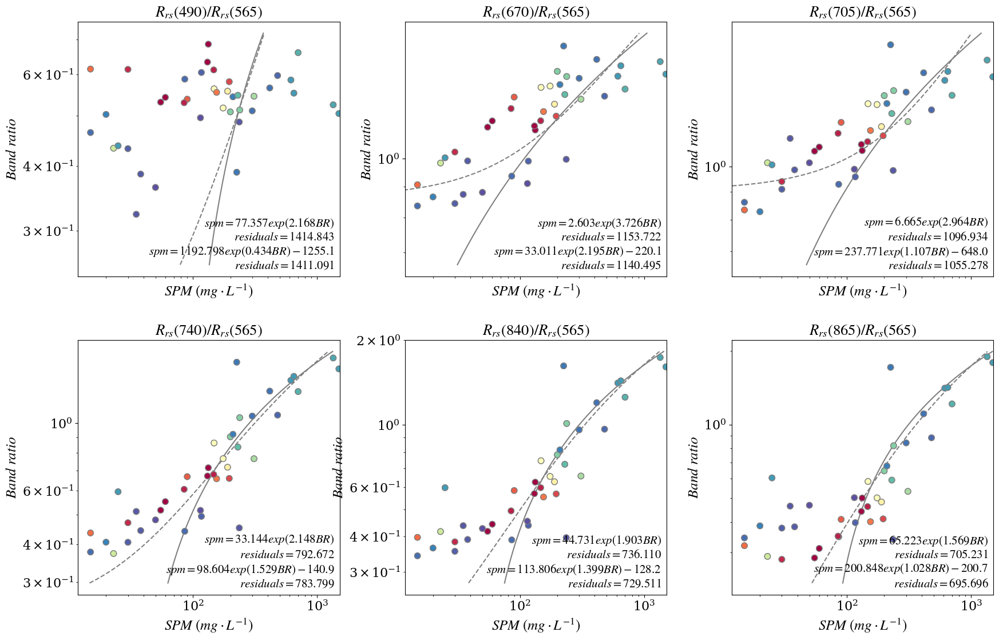

In [77]:
wl_ref=565
cmap = plt.cm.Spectral_r
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 13),sharex=True)
fig.subplots_adjust(left=0.1, right=0.9, hspace=.25, wspace=0.25)
axs = axs.ravel()


for ii,wl in  enumerate([490,670,705,740,840,865]):
    ax=axs[ii]
   
    x, y = xmatchup.spm,xmatchup['median'].sel(wl=wl,method='nearest')/xmatchup['median'].sel(wl=wl_ref,method='nearest')
    color=xmatchup.sza #pix_num.sel(wl=wl,method='nearest')
    ax.scatter(x, y, c=color, cmap=cmap, edgecolors='grey', s=55, alpha=0.97, linewidth=1,zorder=2)
    #y_std = ds.Rrs_std.sel(wl=wl,method='nearest')
    ratio_simu = np.linspace(y.min()*0.8,y.max()*1.05,1000)
    
    acoef=[1,1]
    res_lsq = least_squares(func, acoef, args=( x,y),diff_step=1e-4)
    acoef = res_lsq.x
    print(acoef, res_lsq.cost) 
    ax.plot(func_exp(acoef,ratio_simu),ratio_simu,color='grey')
    acoef2=[1,1,-10]
    res_lsq2 = least_squares(func2, acoef2, args=( x,y),diff_step=1e-4)
    acoef2 = res_lsq2.x
    print(acoef2, res_lsq2.cost) 
    ax.plot(func_exp2(acoef2,ratio_simu),ratio_simu,ls='--',color='grey')
    
    ax.scatter(x, y, c=color, cmap=cmap, edgecolors='grey', s=55, alpha=0.97, linewidth=1,zorder=2)
    #ax.errorbar(x, y, yerr=y_std, marker='', ls='', ecolor='black',zorder=0)
    ax.minorticks_on()
    ax.set_xlabel('$SPM\ (mg\cdot L^{-1})$')
    ax.set_ylabel('$Band\ ratio$')
    ax.loglog()
    stats_label = f'$spm = %.3f exp(%.3f BR)$' % (acoef[0],acoef[1]) + \
            '\n$residuals = %.3f$' % (res_lsq.cost**0.5) + \
            '\n$spm = %.3f exp(%.3f BR)%+.1f$' % (acoef2[0],acoef2[1],acoef2[2]) + \
            '\n$residuals = %.3f$' % (res_lsq2.cost**0.5)
  
    
    ax.text( 0.98,0.02, stats_label, fontsize=15, verticalalignment='bottom', horizontalalignment='right',
                transform=ax.transAxes)
    ax.set_title('$R_{rs}('+str(wl)+')/R_{rs}('+str(wl_ref)+')$')
ax.set_xlim([0,xmatchup.spm.max()+20])

In [37]:
# generate datacube per year (to use if large region-of-interest)

noclobber = False

dcube=[]
for year in range(start_year,end_year+1):
    
    start_date = dt.date(year, 1, 1).strftime("%Y-%m-%d")
    end_date = dt.date(year, 12, 31).strftime("%Y-%m-%d")
    print(start_date)
    dc_path=opj(dcdir,tile+f'_{start_date}_{end_date}'+suffix+'.nc')
    if os.path.exists(dc_path) & noclobber:
        continue
    files = df[start_date:end_date].values.ravel()
    if len(files) == 0:
        continue
        
    dc = grstbx.L2grs(files)
    dc.get_l2a_datacube(subset=bbox)
    #dcube.append(dc.datacube.load())
    dc.datacube.to_netcdf(dc_path)

2018-01-01


KeyboardInterrupt: 

In [9]:
glob.glob(opj(dcdir,tile+'*.nc'))

['/data/satellite/Sentinel-2/datacube/30PYT_2018-01-01_2018-12-31_matchup.nc',
 '/data/satellite/Sentinel-2/datacube/30PYT_2022-01-01_2022-12-31_matchup.nc',
 '/data/satellite/Sentinel-2/datacube/30PYT_2019-01-01_2019-12-31_matchup.nc',
 '/data/satellite/Sentinel-2/datacube/30PYT_2021-01-01_2021-12-31_matchup.nc',
 '/data/satellite/Sentinel-2/datacube/30PYT_2020-01-01_2020-12-31_matchup.nc']

In [2]:
dc1=xr.open_dataset('/data/satellite/Sentinel-2/datacube/30PYT_2018-01-01_2018-12-31_matchup.nc',decode_coords='all')
dc2=xr.open_dataset('/data/satellite/Sentinel-2/datacube/30PYT_2019-01-01_2019-12-31_matchup.nc',decode_coords='all')

In [3]:
xr.concat([dc1.Rrs.drop('central_wavelength'),dc2.Rrs.drop('central_wavelength')],dim='time')

<xarray.DataArray 'Rrs' (time: 53, wl: 11, y: 1669, x: 1843)>
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]], dtype=float32)
Coordinates:
  * wl           (wl) int64 443 490 560 665 705 740 783 842 865 1610 2190
  * time         (time) datetime64[ns] 2018-01-02T10:24:21 ... 2020-01-02T10:...
  * x            (x) float64 7.376e+05 7.376e+05 ... 7.744e+05 7.744e+05
  * y            (y) float64 1.3e+06 1.3e+06 1.3e+06 ... 1.267e+06 1.267e+06
    band         int64 1
    spatial_ref  int64 0

In [4]:
#xr.concat([dc1.load(),dc2.load()],dim='time')
dc1

<xarray.Dataset>
Dimensions:                          (time: 25, wl: 11, y: 1669, x: 1843)
Coordinates:
  * wl                               (wl) int64 443 490 560 ... 865 1610 2190
  * time                             (time) datetime64[ns] 2018-01-02T10:24:2...
  * x                                (x) float64 7.376e+05 ... 7.744e+05
  * y                                (y) float64 1.3e+06 1.3e+06 ... 1.267e+06
    central_wavelength               (time, wl) float32 ...
    band                             int64 ...
    spatial_ref                      int64 ...
Data variables: (12/23)
    Rrs                              (time, wl, y, x) float32 ...
    BRDFg                            (time, y, x) float32 ...
    aot550                           (time, y, x) float32 ...
    mask                             (time, y, x) uint8 ...
    vza                              (time, y, x) float32 ...
    sza                              (time, y, x) float32 ...
    ...                               ...
    flag_opac_cirrus                 (time) float64 ...
    flag_high_swir                   (time) float64 ...
    flag_surfwater_land              (time) float64 ...
    flag_surfwater_water             (time) float64 ...
    flag_surfwater_cloud_and_shadow  (time) float64 ...
    flag_neg_rrs                     (time) float64 ...
Attributes: (12/74)
    long_name:                           CA BLUE GREEN RED VRE_1 VRE_2 VRE_3 ...
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /data/satellite/Sentinel-2/L1C/30PYT...
    product_name:                        S2A_MSIL1C_20180102T102421_N0500_R06...
    product_filename:                    S2A_MSIL1C_20180102T102421_N0500_R06...
    ...                                  ...
    dirdata:                             /data/grs/grsdata
    abs_gas_file:                        /home/harmel/Dropbox/Dropbox/work/gi...
    water_vapor_transmittance_file:      /home/harmel/Dropbox/Dropbox/work/gi...
    metadata_profile:                    datacube
    start_date:                          2018-01-02T10:24:21.000000000
    stop_date:                           2019-01-07T10:24:11.000000000